# Generating Animals using a Diffusion Model based on UNET

----
- **Chosen Paper:** [Diffusion Models Beat GANs on Image Synthesis [Dhariwal, Nichol, 2021]](https://openreview.net/pdf?id=AAWuCvzaVt)
- **Published at:** NeurIPS21
- **Reason for selection:** The reason for choosing this paper is because it had a big impact on how images are generated. The study showed that a diffusion model can produce better results than Generative Adversarial Networks (GANs). This discovery led to a significant change in how researchers approach image generation. By demonstrating better performance in creating images, the paper questioned the dominance of GANs, which have been the main method for making realistic images. This change not only drew a lot of interest from academics but also encouraged more study into diffusion models and how they could be used in different areas besides image generation. Overall, the paper provides important insights and has sparked new ideas for research in visual media and artificial intelligence.


----------
**Other Sources**
- Used Dataset ([Oxford-IIIT Pet Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/))
- Used Tutorials ([Diffusion Models - Live Coding Tutorial
](https://youtu.be/S_il77Ttrmg), )
- Used Repositories ([Denoising Diffusion Pytorch](https://github.com/lucidrains/denoising-diffusion-pytorch), [The Annotated Diffusion Model](https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023))

-------
**Modification Overview:**
- Dataset change to Dogs and Cats
- Changed order and structure of code blocks
- Code adjustments and comments
- Tested different hyper parameters such as batch sizes, epochs, etc.
- Added weight saving and resuming mechanism
--------

## Setup

###Imports

In [ ]:
import os
import math
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
from torch.utils.data import DataLoader

import torchvision
from torchvision import transforms

from google.colab import files

###Dataset

100%|██████████| 791918971/791918971 [00:43<00:00, 18185233.43it/s]


Extracting oxford-iiit-pet/images.tar.gz to oxford-iiit-pet


100%|██████████| 19173078/19173078 [00:02<00:00, 7671581.89it/s] 


Extracting oxford-iiit-pet/annotations.tar.gz to oxford-iiit-pet


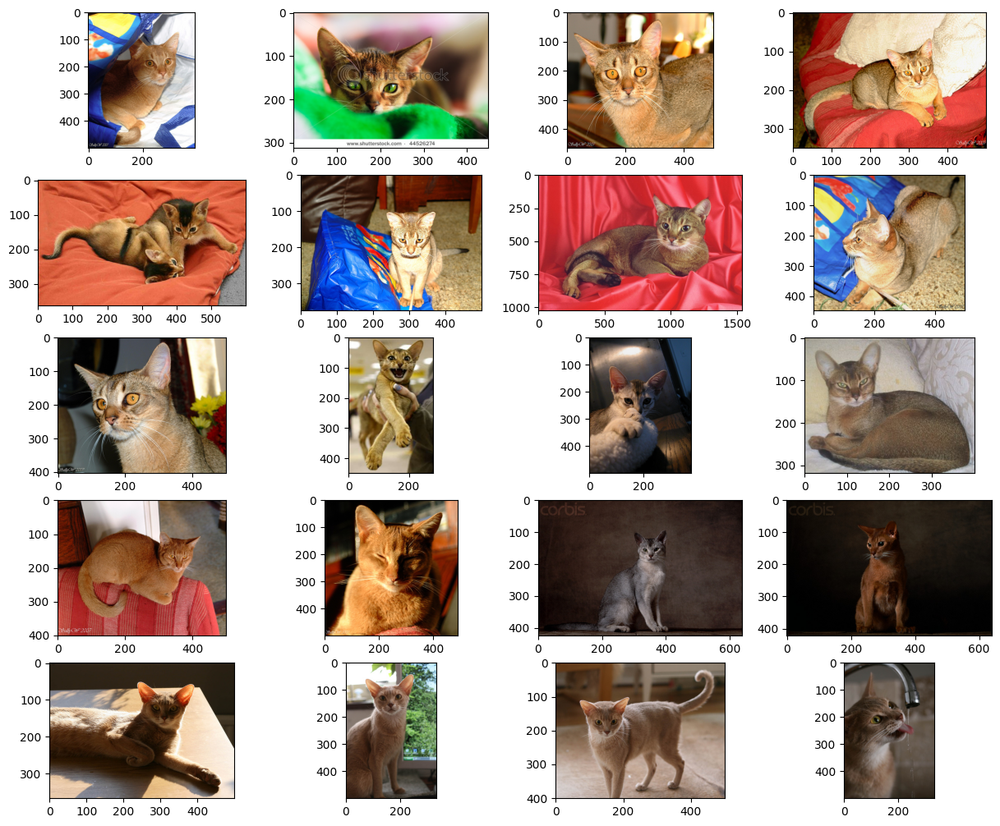

In [1]:
def show_images(datset, num_samples=20, cols=4):
    """ Plots some samples from the dataset """
    plt.figure(figsize=(15,15))
    for i, img in enumerate(data):
        if i == num_samples:
            break
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(img[0])

#Download the dataset
data = torchvision.datasets.OxfordIIITPet(root="./", download=True)

# Show images from the dataset
show_images(data)

## Image (Pre-)Processing

### Step 1: The forward process = Noise scheduler




In [ ]:
IMG_SIZE = 64
BATCH_SIZE = 128
T = 300  # Number of timesteps for diffusion
device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    """
    Returns a linear schedule of betas from start to end over the given timesteps.
    """
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)

# Define beta schedule
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

In [3]:
def load_transformed_dataset():
    """
    Loads and transforms the OxfordIIITPet dataset.
    Returns a concatenated dataset of train and test splits.
    """
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    train = torchvision.datasets.OxfordIIITPet(root="./", download=True, transform=data_transform)
    test = torchvision.datasets.OxfordIIITPet(root=".", download=True, transform=data_transform, split='test')

    # Return concatenated train and test datasets
    return torch.utils.data.ConcatDataset([train, test])

def show_tensor_image(image):
    """
    Displays a tensor image.
    """
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2), # Scale back to [0, 1]
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.), # Scale to [0, 255]
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)), # Convert to uint8
        transforms.ToPILImage(), # Convert to PIL Image
    ])

    # Take the first image of the batch if batch dimension exists
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

<ipython-input-4-f4853fe96c6f>:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images+1, int(idx/stepsize) + 1)


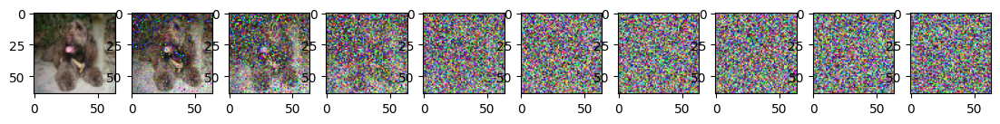

In [4]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 6
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

### Step 2: The Diffusion Model / UNet



In [5]:
import torch
from torch import nn
import math

class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp = nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2 * in_ch, out_ch, kernel_size=3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, kernel_size=4, stride=2, padding=1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu = nn.ReLU()

    def forward(self, x, t):
        # First Conv
        h = self.conv1(x)
        h = self.relu(self.bnorm1(h))
        # Time embedding
        time_emb = self.time_mlp(t)
        time_emb = time_emb.unsqueeze(-1).unsqueeze(-1)
        h = h + time_emb
        # Second Conv
        h = self.conv2(h)
        h = self.relu(self.bnorm2(h))
        # Down or Upsample
        return self.transform(h)

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


class SimpleUnet(nn.Module):
    def __init__(self):
        super().__init__()
        image_channels = 3 #RGB
        down_channels = (64, 128, 256, 512, 1024) # increase depth while going down in UNET
        up_channels = (1024, 512, 256, 128, 64) #decreases depth while going up in UNET
        out_dim = 3
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.ReLU()
        )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], kernel_size=3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([
            Block(down_channels[i], down_channels[i + 1], time_emb_dim)
            for i in range(len(down_channels) - 1)
        ])

        # Upsample
        self.ups = nn.ModuleList([
            Block(up_channels[i], up_channels[i + 1], time_emb_dim, up=True)
            for i in range(len(up_channels) - 1)
        ])

        self.output = nn.Conv2d(up_channels[-1], out_dim, kernel_size=1)

    def forward(self, x, timestep):
        t = self.time_mlp(timestep)
        x = self.conv0(x)
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Number of parameters: ", sum(p.numel() for p in model.parameters()))
model


Number of parameters:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor

### Step 3: The loss



In [6]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

### Sampling
- Without adding @torch.no_grad() we quickly run out of memory, because pytorch tacks all the previous images for gradient calculation
- Because we pre-calculated the noise variances for the forward pass, we also have to use them when we sequentially perform the backward process

In [7]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.

    Args:
    - x (torch.Tensor): The noisy input image.
    - t (torch.Tensor): The current timestep.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)

    # Model's prediction of the noise in the image
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:
        # If t == 0, return the model mean without adding noise
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image():
    """
    Generates and plots a series of images showing the denoising process.
    """
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

## Training

Pretrained weights file does not exist, new training started
Epoch 0 | step 000 Loss: 0.8060843348503113 


<ipython-input-7-23d9a600a066>:44: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize)+1)


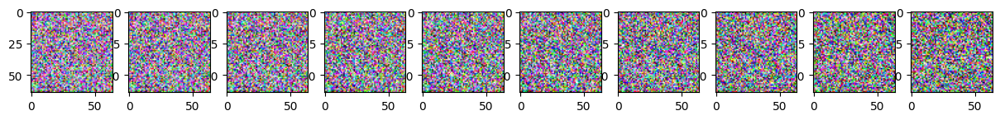

Epoch 15 | step 000 Loss: 0.17000238597393036 


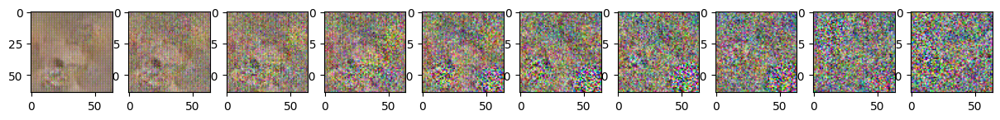

Epoch 30 | step 000 Loss: 0.16948871314525604 


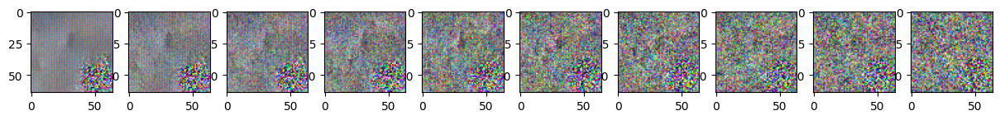

Epoch 45 | step 000 Loss: 0.15776172280311584 


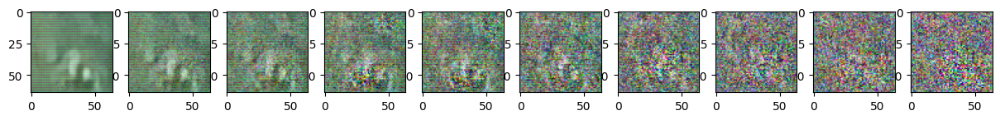

Epoch 60 | step 000 Loss: 0.16476574540138245 


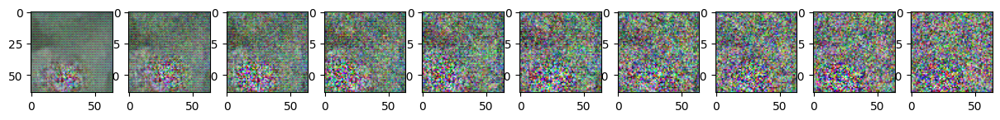

Epoch 75 | step 000 Loss: 0.1584949493408203 


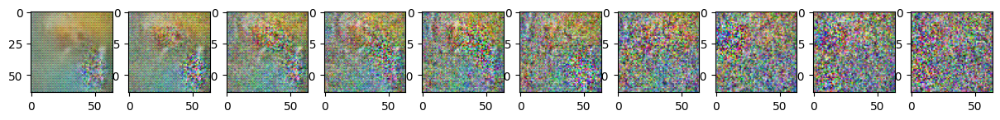

Epoch 90 | step 000 Loss: 0.16313043236732483 


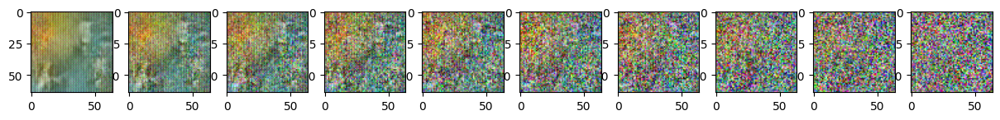

Epoch 105 | step 000 Loss: 0.1404145210981369 


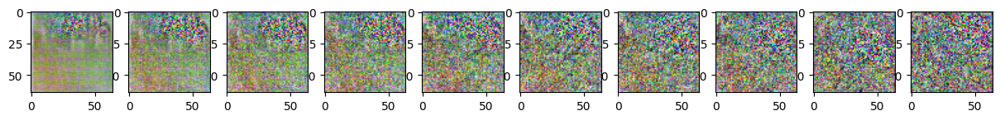

Epoch 120 | step 000 Loss: 0.15635225176811218 


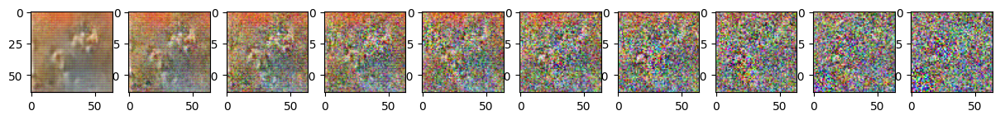

Epoch 135 | step 000 Loss: 0.15328553318977356 


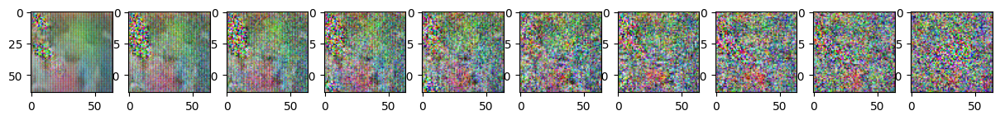

Epoch 150 | step 000 Loss: 0.1460910141468048 


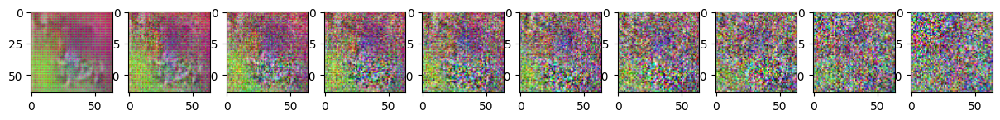

Epoch 165 | step 000 Loss: 0.14258334040641785 


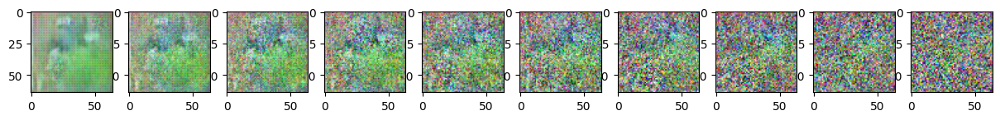

Epoch 180 | step 000 Loss: 0.15170292556285858 


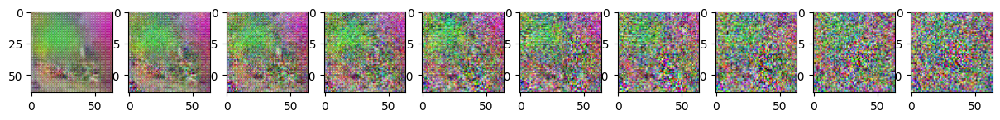

Epoch 195 | step 000 Loss: 0.13918328285217285 


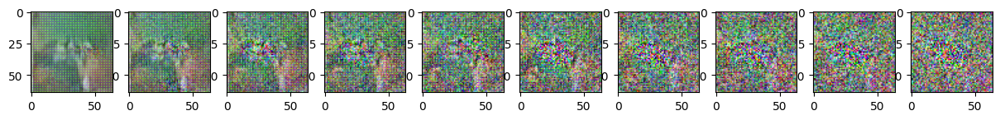

Epoch 210 | step 000 Loss: 0.13948628306388855 


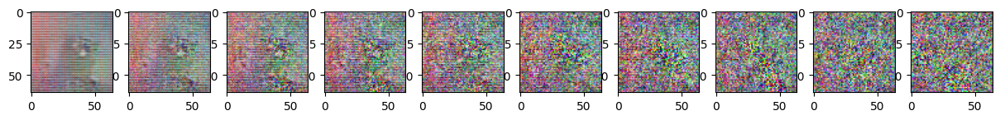

Epoch 225 | step 000 Loss: 0.14582520723342896 


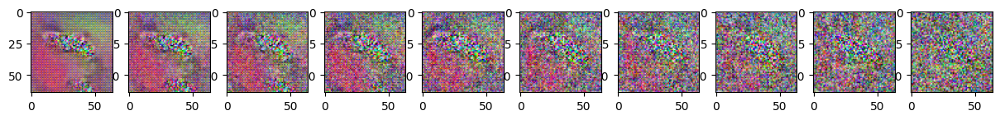

Epoch 240 | step 000 Loss: 0.15184471011161804 


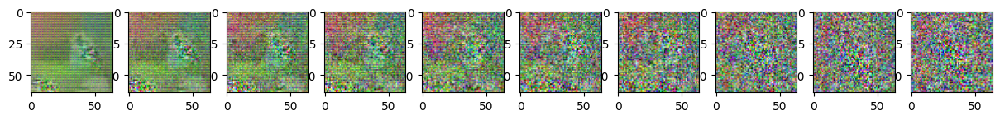

Epoch 255 | step 000 Loss: 0.15210384130477905 


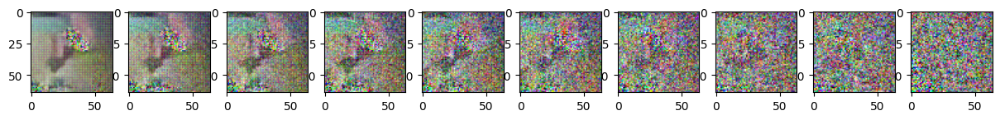

Epoch 270 | step 000 Loss: 0.14288464188575745 


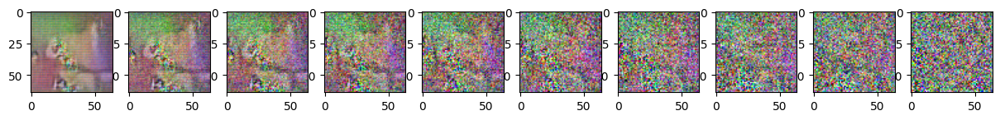

Epoch 285 | step 000 Loss: 0.14087510108947754 


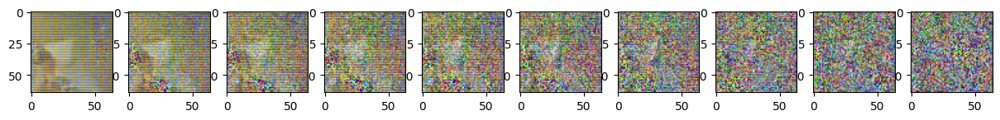

Epoch 300 | step 000 Loss: 0.13762031495571136 


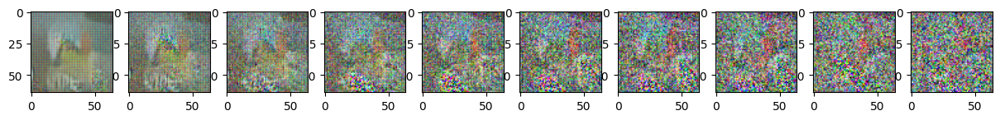

Epoch 315 | step 000 Loss: 0.1404871791601181 


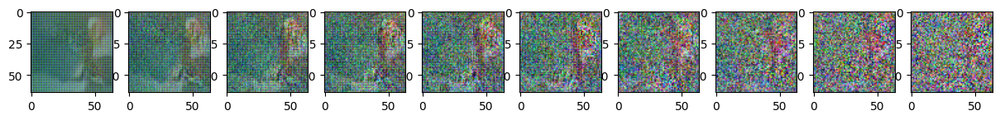

Epoch 330 | step 000 Loss: 0.14302679896354675 


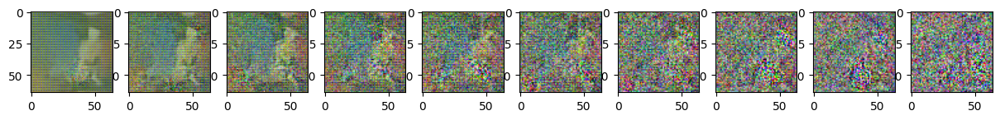

Epoch 345 | step 000 Loss: 0.13322778046131134 


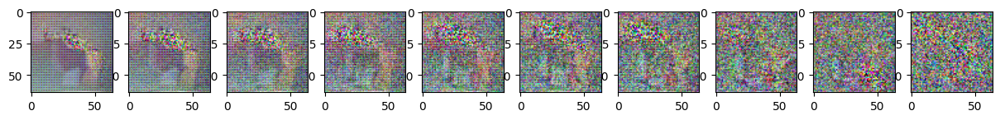

In [ ]:
from torch.optim import Adam
import os

# Set device to GPU if available, else CPU
device = "cuda" if torch.cuda.is_available() else "cpu"

# Path to the saved model weights
weigthPath = "/content/epoch_14"

# Load model weights if they exist
if os.path.exists(weigthPath):
    model.load_state_dict(torch.load(weigthPath))
    print(f"Loaded weights from {weigthPath}")
else:
    print(f"Pretrained weights file does not exist, new training started")


model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 600 # Number of training epochs

# Training loop
for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, batch[0], t)
      loss.backward()
      optimizer.step()

      # Print and save model at regular intervals
      if epoch % 15 == 0 and step == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        sample_plot_image()
        torch.save(model.state_dict(), f"epoch_{epoch}")